In [1]:
import transformers
import datasets
import shap
from shap.plots import *
import csv
import nltk
import re, string
import pandas as pd
import numpy as np
from nltk.tokenize import word_tokenize
from collections import Counter
%matplotlib inline
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import datetime
import torch
import random
from PIL import Image


c:\Users\mrsaf\Desktop\studia\MGR\SEM1\UM\shapProjekt\environ\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
# convert date from string to datetime object
def convert_date(tweets):
    for i in range(len(tweets)):
        tweets['date'][i] = datetime.datetime.strptime(tweets['date'][i], '%Y-%m-%d %H:%M:%S')
    return tweets
        
# select n random tweets from start date to end date
def choose_tweets_from_date(tweets, start, end, n):
    start = datetime.datetime.strptime(start, '%Y-%m-%d')
    end = datetime.datetime.strptime(end, '%Y-%m-%d')
    choices = []
    for i in range(len(tweets)):
        if start <= tweets['date'][i] <= end:
            el = tweets['content'][i]
            choices.append(el)
        
    chosen=random.sample(choices, n)

    return chosen

def clean_text(text):
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('\'','', text)
    
    return text

def load_and_preprocess_tweets():
    tweets = pd.read_csv('WFiIS-UM/datasets/realdonaldtrump.csv')
    tweets = tweets.drop(['link', 'retweets', 'favorites', 'mentions', 'hashtags'], axis=1)

    tweets['content'] = tweets['content'].map(lambda x: re.sub(r'@\w+\s', ' ', x))
    tweets['content'] = tweets['content'].map(lambda x: re.sub(r'https?://\S+|www\.\S+', '', x))
    tweets['content'] = tweets['content'].map(lambda x: re.sub(r'\W+', ' ', x))
    tweets['content'] = tweets['content'].replace(r'\W+', ' ', regex=True)
    tweets['content'] = tweets['content'].apply(lambda x: clean_text(x))
    tweets['token'] = tweets['content'].apply(lambda x: word_tokenize(x))
    tweets['text'] = tweets['token'].apply(lambda x: ' '.join([word for word in x if len(word)>2]))
    convert_date(tweets)

    return tweets

In [10]:
tweets = load_and_preprocess_tweets()

In [11]:
n = 20
before = choose_tweets_from_date(tweets, '2011-01-01', '2017-01-19', n)
after = choose_tweets_from_date(tweets, '2017-01-20', '2021-01-20', n)
before

['watch out champion joanrivers returns to the boardroom as a judge in this week s all star celebrity apprenticenbc don t cross her ',
 ' speak to vince ',
 'rush limbaugh trump has changed the entire debate on immigration ',
 ' eileenjael realdonaldtrump carrienguns do you think the bushes knew justice roberts was going to pull an obamacare stunt like that ',
 '  us infrastructure is seriously deficient antrump is the only one talking about it lets go trump ',
 'wow just  day after my offer to fund all wh tours obama backtracks on decision to cancel all white house tours ',
 ' realkylemorris you will love it ',
 '  listening to realdonaldtrump on the howard stern show what a guy sternshow',
 ' trumpvine where is the money macmiller ',
 'if you can t handle the hard times that come with business then you will never be able to celebrate the successes focus stay positive ',
 'forbes travel guide has unveiled its  annual listing of five and four star hotels restaurants and spas cont ',
 '

In [12]:
top = Counter([item for sublist in tweets['token'] for item in sublist])
temp = pd.DataFrame(top.most_common(20))
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Blues')

,Common_words,count
0,the,34657
1,to,19801
2,and,15928
3,a,15491
4,of,13345
5,is,12886
6,in,11942
7,i,10795
8,you,10716
9,for,9991


In [13]:
fig = px.bar(temp, x="count", y="Common_words", title='Common Words in Selected Text', orientation='h', 
          width=700, height=700,color='Common_words')
fig.show()

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)
Partition explainer: 51it [05:46,  7.06s/it]                        
c:\Users\mrsaf\Desktop\studia\MGR\SEM1\UM\shapProjekt\environ\lib\site-packages\slicer\slicer_internal.py:443: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



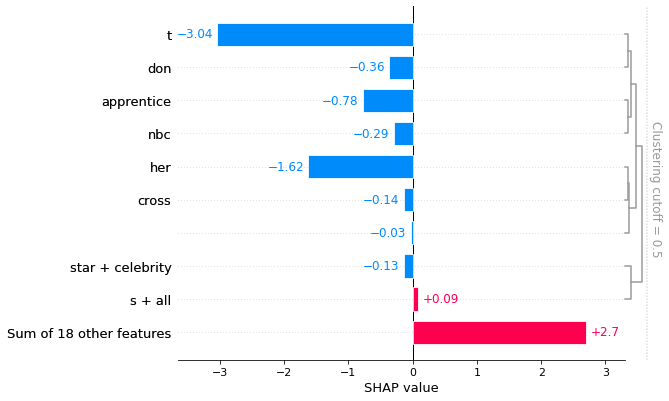

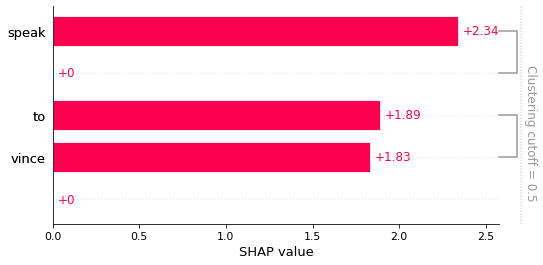

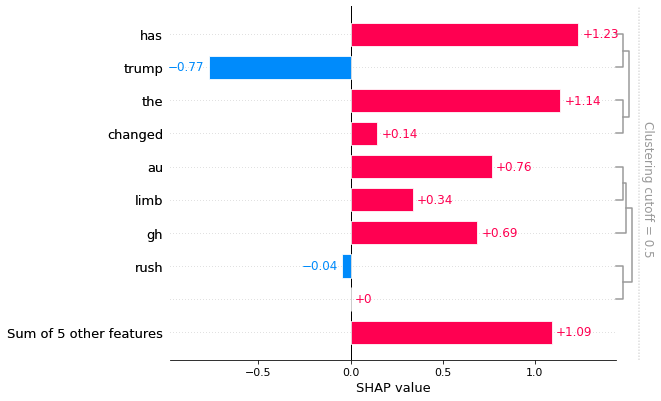

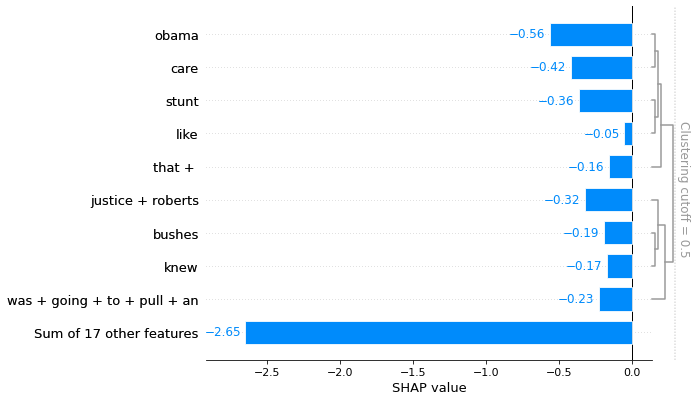

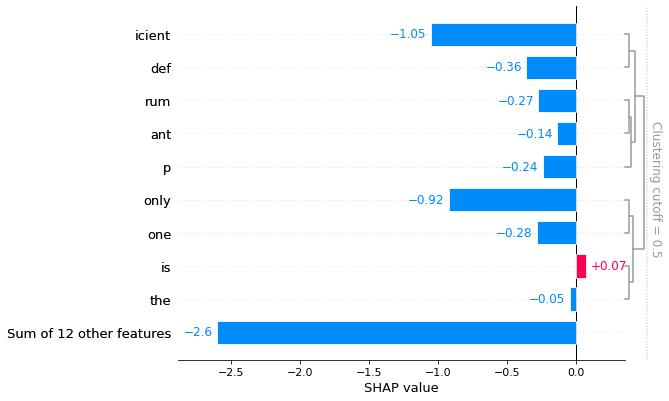

...

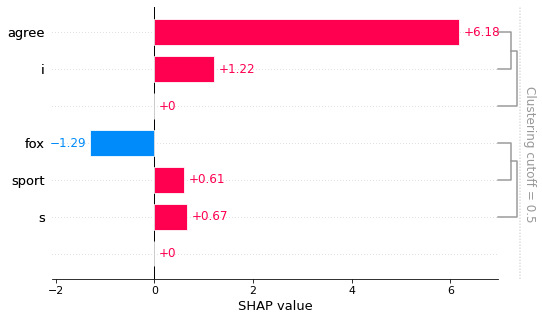

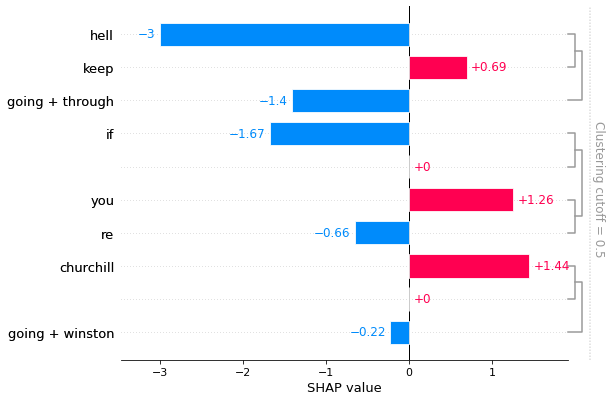

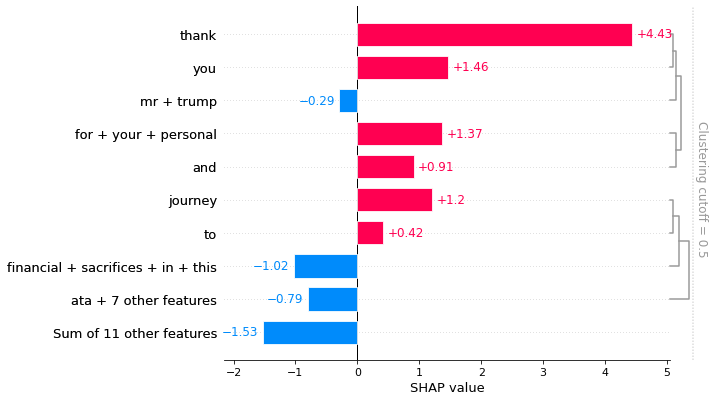

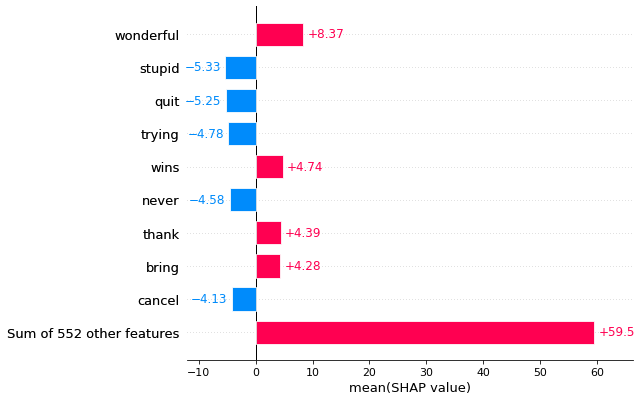

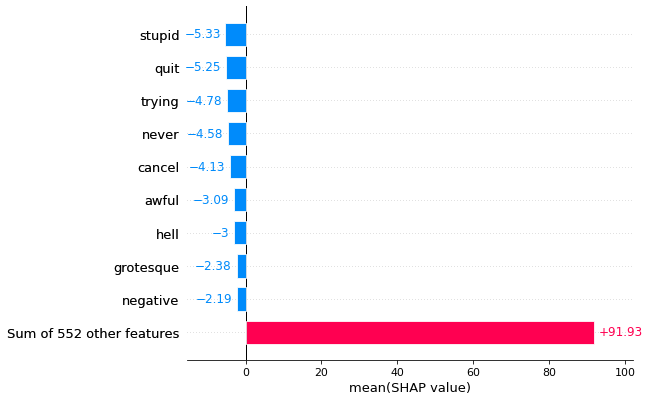

In [14]:
classifier = transformers.pipeline('sentiment-analysis', return_all_scores=True)
classifier(before)

pmodel = shap.models.TransformersPipeline(classifier, rescale_to_logits=True) 

explainer2 = shap.Explainer(pmodel)
shap_values = explainer2(before)
shap.plots.text(shap_values[:,:,1])

for i in range(n):
    shap.plots.bar(shap_values[i, :,"POSITIVE"])
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0))
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0), order=shap.Explanation.argsort)

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)


0.10198342805882497


Partition explainer: 51it [07:00,  8.59s/it]                        


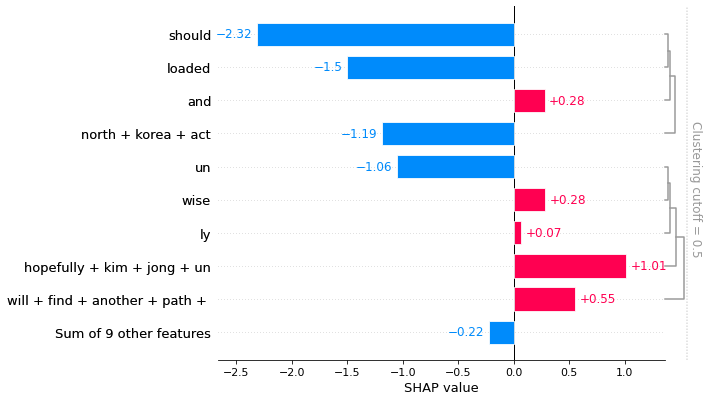

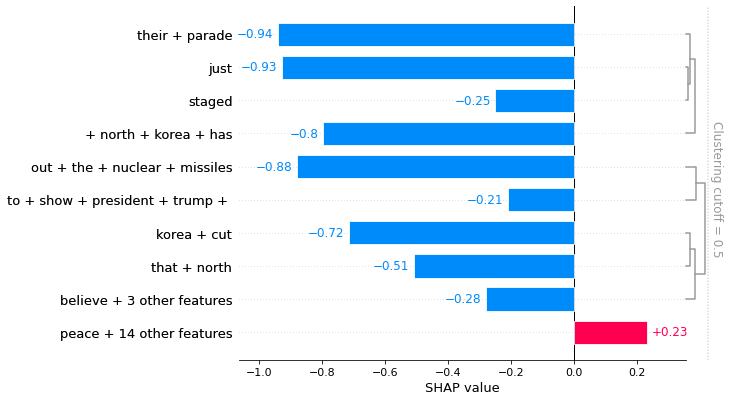

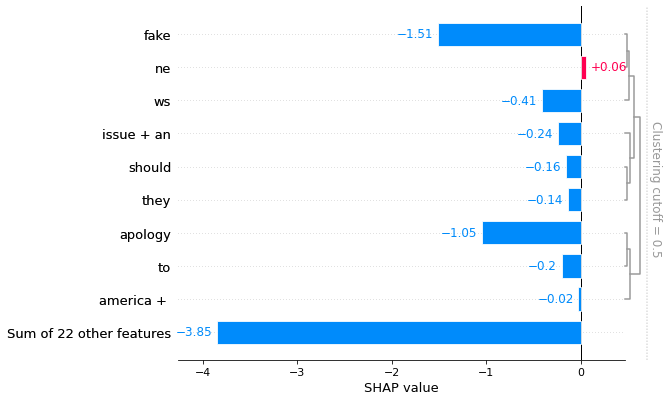

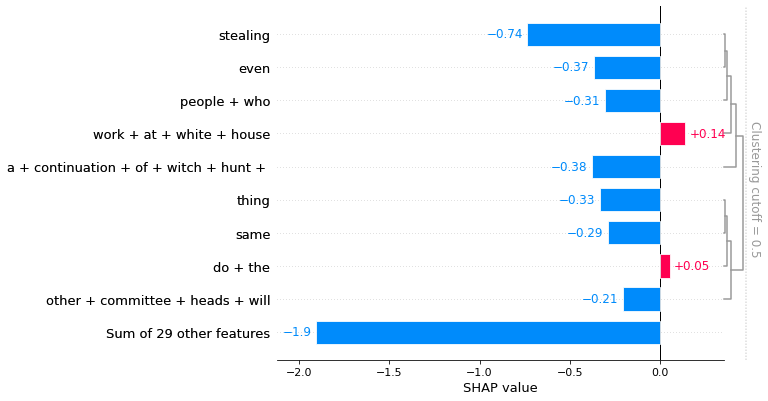

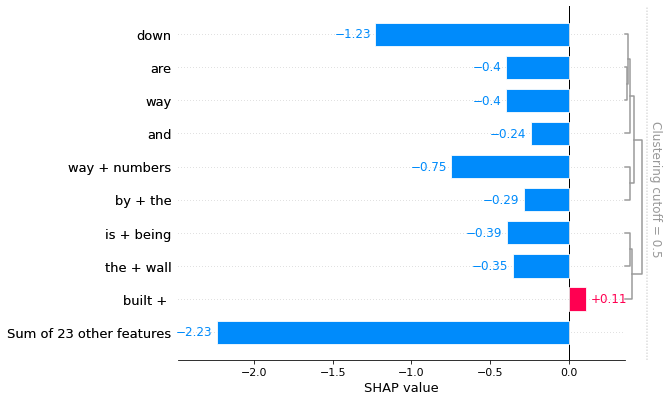

...

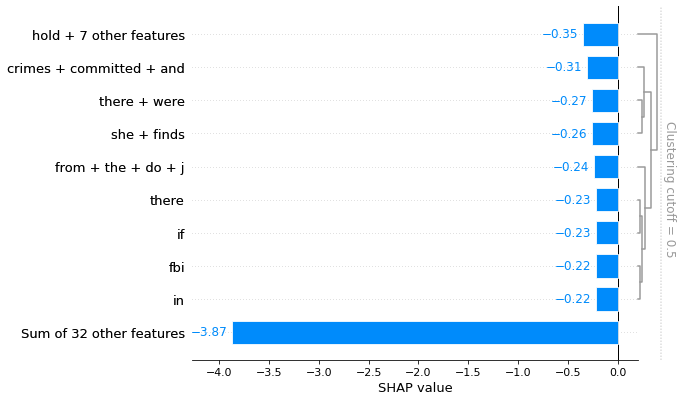

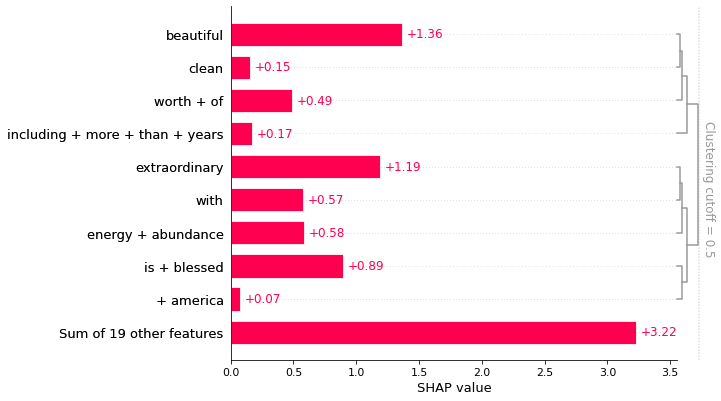

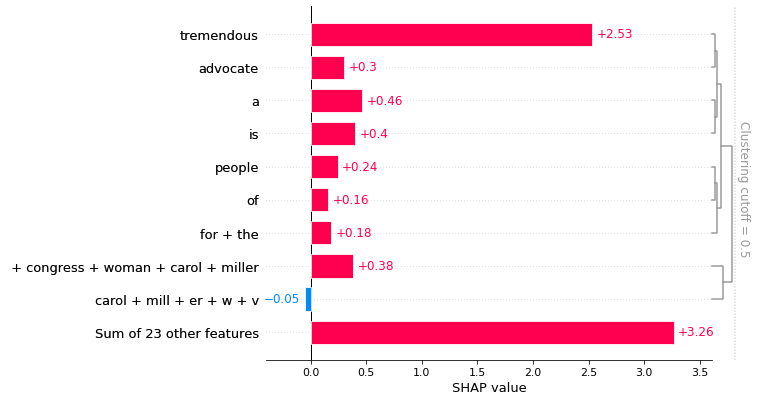

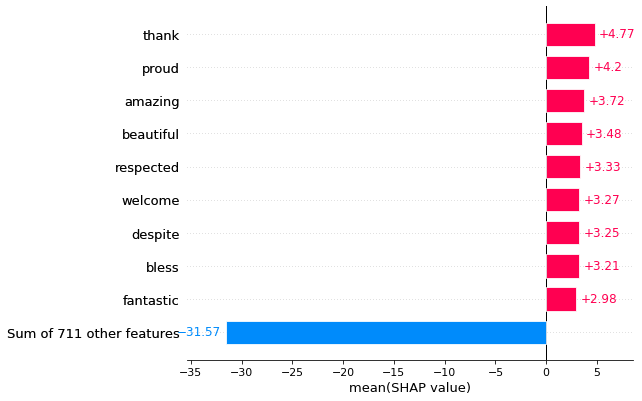

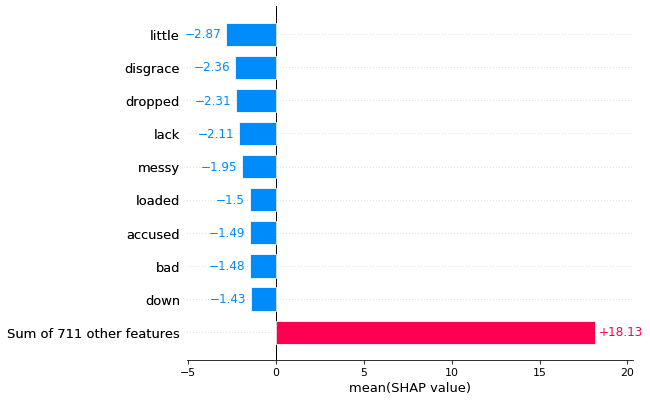

In [15]:
average_before = sum(shap_values[:, :, "POSITIVE"].mean(0).values)/len(shap_values[:, :, "POSITIVE"].mean(0).values)
print(average_before)

classifier = transformers.pipeline('sentiment-analysis', return_all_scores=True)
classifier(after)

pmodel = shap.models.TransformersPipeline(classifier, rescale_to_logits=True)

explainer2 = shap.Explainer(pmodel)
shap_values = explainer2(after)
shap.plots.text(shap_values[:,:,1])

for i in range(n):
    shap.plots.bar(shap_values[i, :,"POSITIVE"])
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0))
shap.plots.bar(shap_values[:, :, "POSITIVE"].mean(0), order=shap.Explanation.argsort)

In [16]:
average_after = sum(shap_values[:, :, "POSITIVE"].mean(0).values)/len(shap_values[:, :, "POSITIVE"].mean(0).values)

average_before
average_after

0.000878339717981411

In [17]:
negative, positive = np.zeros((tweets.shape[0], 1)), np.zeros((tweets.shape[0], 1))

In [18]:
for i, tweet in enumerate(before):
    output = classifier(tweet)
    score = output[0][0].detach().numpy()
    scores = softmax(score)
    negative[i] = scores[0]
    positive[i] = scores[2]

tweets['Negative'] = negative
tweets['Positive'] = positive

AttributeError: 'dict' object has no attribute 'detach'

c:\Users\mrsaf\Desktop\studia\MGR\SEM1\UM\shapProjekt\environ\lib\site-packages\slicer\slicer_internal.py:443: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



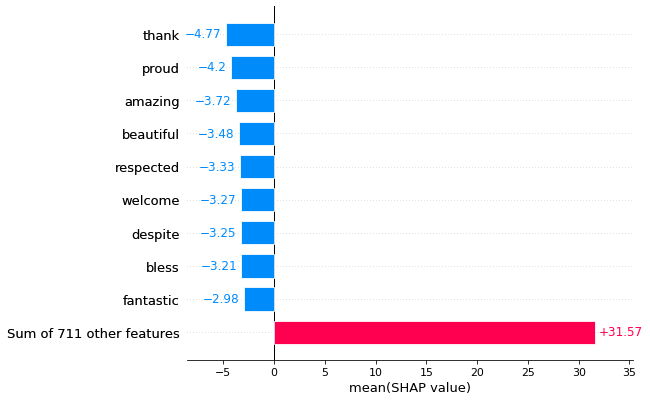

In [19]:
shap.plots.bar(shap_values[:, :, "NEGATIVE"].mean(0), order=shap.Explanation.argsort)